| Based on Fight Logs from Jan 2nd 2023 through May 29th 2023 |  |  |  |
|-------------------------------------------------------------|--|--|--|
|  |  |  |  |
| Total Number of Fights |  |  |  |
| 1,808 | Allies | Enemies | Duration |
| Min | 8 | 5 | 20 |
| 25% Quartile | 43 | 30 | 54 |
| 50% Quartile | 47 | 49 | 91 |
| 75% Quartile | 49 | 61 | 157 |
| Max | 52 | 135 | 3,634 |


In [1]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

import pandas as pd

In [6]:
df = pd.read_excel('d:/FluxData.xlsx')
print('Completed Data Load')

Completed Data Load


In [8]:
df.head()

,Account,Name,Profession,Role,ID,Rally Num,Fight Num,Date,Start Time,End Time,...,Fury Uptime while damaging,Resistance Uptime while damaging,Resolution Uptime while damaging,Quickness Uptime while damaging,Swiftness Uptime while damaging,Alacrity Uptime while damaging,Vigor Uptime while damaging,Regeneration Uptime while damaging,Stability Uptime while damaging,Might Avg Stack while damaging
0,HeiRoPhaNt.3140,Saint Mire,Firebrand,Support,1-1,1,1,2023-01-01,22:00:53,22:01:20,...,0.471504,0.056752,1.0,0.794493,1.0,0.260435,0.851181,1.0,0.992859,2.188601
1,xivor.8754,Xivorrr,Scrapper,Dps,1-1,1,1,2023-01-01,22:00:53,22:01:20,...,1.000000,0.000000,1.0,0.763100,1.0,0.104669,0.000000,1.0,1.000000,20.440899
2,MadKing IX.3725,Xi Lannister,Berserker,Dps,1-1,1,1,2023-01-01,22:00:53,22:01:20,...,1.000000,0.000000,1.0,0.671132,1.0,1.000000,0.000000,1.0,1.000000,8.098637
3,Drevarr.9458,Drevarr Moonwillow,Scrapper,Support,1-1,1,1,2023-01-01,22:00:53,22:01:20,...,1.000000,0.832416,1.0,0.000000,1.0,0.000000,1.000000,1.0,0.000000,7.000637
4,Sakis.2985,Sakis Ranger,Soulbeast,Dps,1-1,1,1,2023-01-01,22:00:53,22:01:20,...,1.000000,0.000000,1.0,1.000000,1.0,1.000000,0.000000,1.0,1.000000,15.484119


In [11]:
fig = px.histogram(df, x="Profession")

fig.show()

In [26]:
mean_DPS = (
    df[df.Role != "Support"].groupby("Profession")["Duration DPS"].mean().reset_index()
)
mean_DPS.sort_values(by=['Duration DPS'])
mean_DPS

,Profession,Duration DPS
0,Berserker,1175.969605
1,Bladesworn,106.010807
2,Catalyst,820.071605
3,Chronomancer,176.923048
4,Daredevil,671.180562
5,Deadeye,153.686551
6,Dragonhunter,676.041189
7,Druid,120.192477
8,Elementalist,419.594743
9,Engineer,214.918566


In [28]:
fig = px.bar(mean_DPS.sort_values(by=['Duration DPS'], ascending=False), x="Profession", y="Duration DPS", color="Profession")

fig.update_layout(
  title="Average DPS for each Profession not marked Support Role",
  xaxis_title="",
  yaxis_title="Average DPS",
)
fig.show()

import plotly.io as pio
pio.write_html(fig, file="Avg_DPS_by_Profession_Bar_Not Support.html", auto_open=True)


In [34]:
fig = px.box(df[df.Role != "Support"], x="Profession", y="Duration DPS", color="Profession")

fig.update_layout(
  title="Box Plot of DPS for each Profession not Marked Support",
  xaxis_title="Profession",
  yaxis_title="Duration DPS",
)

fig.show()
import plotly.io as pio
pio.write_html(fig, file="DPS_by_Profession_Box_Plot_Not Support.html", auto_open=True)

In [36]:
fig = px.scatter(df[df.Role != "Support"], x="Profession", y="Duration DPS", size="Duration DPS", color="Profession")

fig.update_layout(
  title="Scatter Chart - Profession(Not Marked Support) vs. Duration DPS",
  xaxis_title="Profession",
  yaxis_title="Duration DPS",
)

fig.show()

import plotly.io as pio
pio.write_html(fig, file="DPS_by_Profession_Scatter_Plot_Not Support.html", auto_open=True)

In [48]:
    Output = df[df.Role != "Support"].groupby([pd.cut(df['Duration'], [0, 30]), 'Profession']).agg({'Duration DPS':['mean']})

In [49]:
print(Output)

                      Duration DPS
                              mean
Duration Profession               
(0, 30]  Berserker      554.942095
         Bladesworn            NaN
         Catalyst       567.859302
         Chronomancer   151.895843
         Daredevil       19.923247
         Deadeye        276.709926
         Dragonhunter   615.276390
         Druid           49.880271
         Elementalist   312.504117
         Engineer              NaN
         Firebrand      147.163979
         Guardian        10.327218
         Harbinger      365.710827
         Herald         396.057441
         Holosmith      621.016008
         Mechanist      294.681287
         Mesmer                NaN
         Mirage         125.375645
         Necromancer    307.950790
         Ranger         340.226742
         Reaper         439.457483
         Renegade        52.081904
         Revenant              NaN
         Scourge        401.926291
         Scrapper       531.810531
         Soulbeast  

In [53]:
fig = px.bar(Output, x="Profession", y="Duration DPS, mean", color="Profession")

fig.update_layout(
  title="Average DPS for each Profession not marked Support Role",
  xaxis_title="",
  yaxis_title="Average DPS",
)
fig.show()

ValueError: Value of 'x' is not the name of a column in 'data_frame'. Expected one of [('Duration DPS', 'mean')] but received: Profession

<AxesSubplot:xlabel='Duration,Profession'>

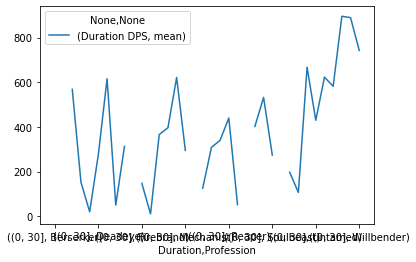

In [57]:
Output.plot()